# Author: Midrar Adham
## Image Processing

In [2]:
import os
import cv2 as cv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pprint import pprint as pp
import matplotlib.ticker as ticker
from mpl_toolkits.axes_grid1 import ImageGrid

In [3]:
dir = '../../sample_data/'
ocean_img = cv.imread(dir+'ocean.JPG')
ocean_img = cv.cvtColor(ocean_img, cv.COLOR_BGR2RGB)
downtown_img = cv.imread(dir+'downtown.JPG')
downtown_img = cv.cvtColor(downtown_img, cv.COLOR_BGR2RGB)

In [4]:
def disp_images (shape = tuple, images = list, title = list, params = bool):
    fig = plt.figure(figsize = (16,10))
    grid = ImageGrid(fig=fig,
                 rect=(1,1,1),
                 nrows_ncols=shape,
                 axes_pad=0.25, # gap between axes
                 label_mode='L'
                 )
    
    for ax, im, t in zip(grid, images, title):
        if params is False:
            ax.set_title(t)
            ax.imshow(im)
        elif params is True:
            ax.set_title(t)
            ax.imshow(im, cmap='gray', vmin=0, vmax=256)
        else:
            ax.set_title(t)
            ax.imshow(im, cmap='gray')
            

# Pixel Transformations
**Show an image next to two transformed images that have been brightened with a positive bias and dimmed with a negative bias**
---

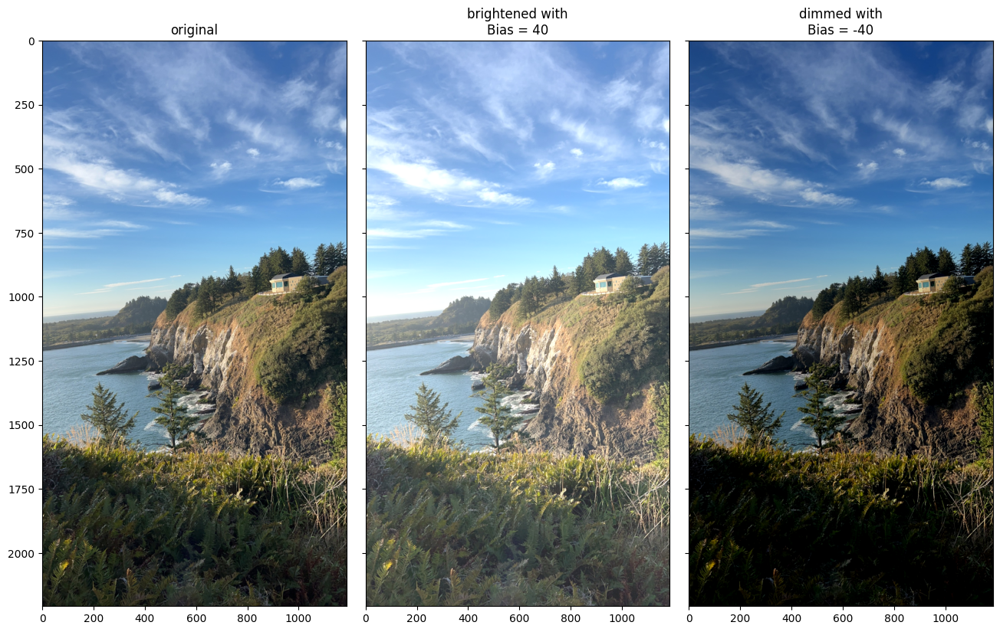

In [5]:
bias = 40
bright_ocean_img = cv.add(ocean_img, bias)
dim_ocean_img = cv.add(ocean_img, bias * -1)
disp_images(shape=(1,3), images=[ocean_img, bright_ocean_img, dim_ocean_img],
            title=['original',f'brightened with\nBias = {bias}',f'dimmed with\nBias = {bias * -1}'],
            params=False)

**Show an image next to two transformed images that have been scaled with a scale factor greater than 1.0 and with a scale factor less than 1.0**
---

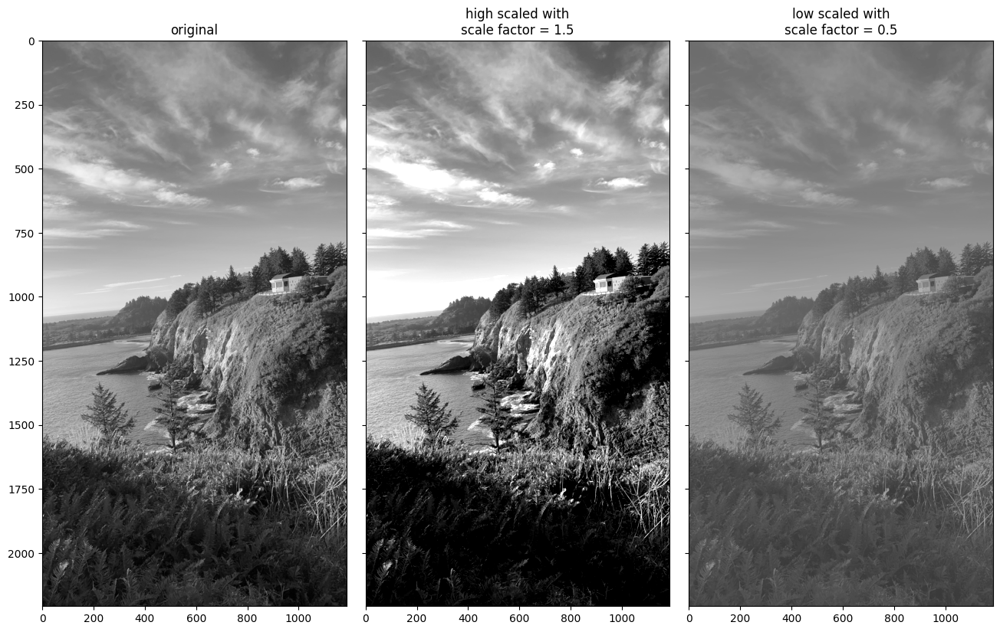

In [6]:
high_scale_factor = 1.5
low_scaled_factor = 0.5
cp_ocean_img = ocean_img.copy().astype(np.float32)
gray_ocean_img = cv.cvtColor(cp_ocean_img,cv.COLOR_RGB2GRAY)

mean_ocean_img = gray_ocean_img.mean()
high_scaled_ocean_img = (gray_ocean_img-mean_ocean_img) * high_scale_factor + mean_ocean_img
low_scaled_ocean_img = (gray_ocean_img-mean_ocean_img) * low_scaled_factor + mean_ocean_img

disp_images(shape=(1,3),
            images=[gray_ocean_img, high_scaled_ocean_img, low_scaled_ocean_img],
            title=['original',f'high scaled with\nscale factor = {high_scale_factor}',
                   f'low scaled with\nscale factor = {low_scaled_factor}'],
            params=True)

**Show two original images, and then a blended version of these images**
---

Here is the equation for blending two images:
$$
\begin{equation*}
g(x) = (1-\alpha)f_{o} + \alpha f_{1}(x)
\end{equation*}
$$
where:

- $\alpha$ is the weight of the pixels array in the first image.
- $\beta$ is the weight of the pixels array in the second image.
- $f_{0}$ is the first image represented as a fucntion.
- $f_{1}$ is the second image represented as a fucntion.
- $g(x)$ is the blended output image represented by a function.

However, as per the [OpenCV documentation](https://docs.opencv.org/4.x/d0/d86/tutorial_py_image_arithmetics.html), another aparameter
is added to adjust the brightness. Adding this parameter to the equation, it becomes:

$$
\begin{equation*}
g(x) = (1-\alpha)f_{o} + \alpha f_{1}(x) + \gamma
\end{equation*}
$$

In this question, $\beta$ is given higher value than $\alpha$ to get the second image more appearance than the first image in the output.

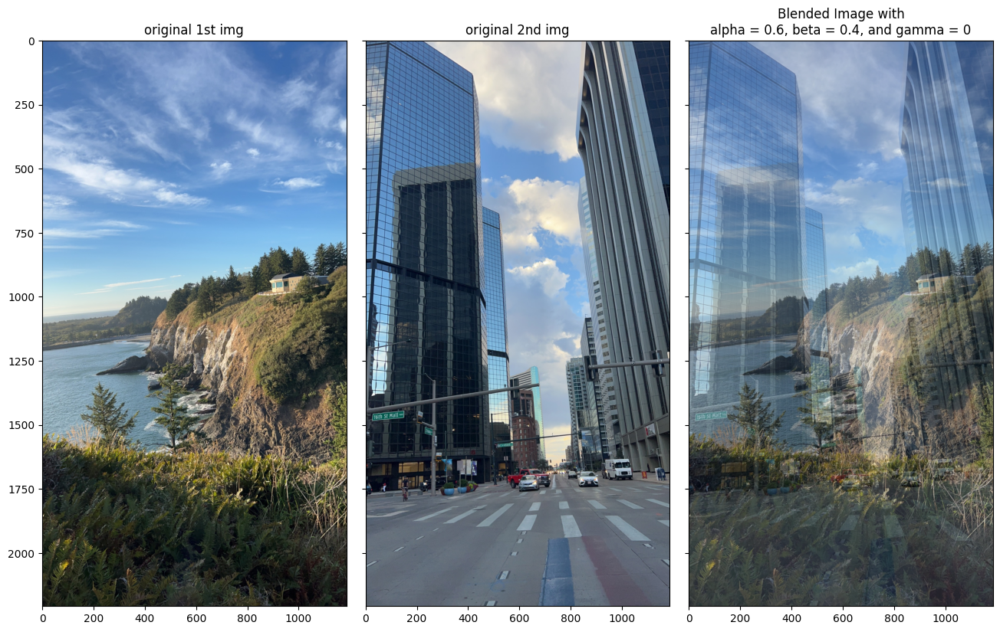

In [7]:
alpha = 0.6
beta = 0.4
gamma = 0
blended = cv.addWeighted(src1=ocean_img, alpha=alpha,src2=downtown_img,beta=beta,gamma=gamma)
# disp_images
disp_images(shape=(1,3),
            images=[ocean_img, downtown_img, blended],
            title=['original 1st img','original 2nd img',f'Blended Image with\nalpha = {alpha}, beta = {beta}, and gamma = {gamma}'],
            params=False)

**Show an original image, a masked version of that image, a second image, and finally the original image with everything outside the mask replaced by the second image**
---

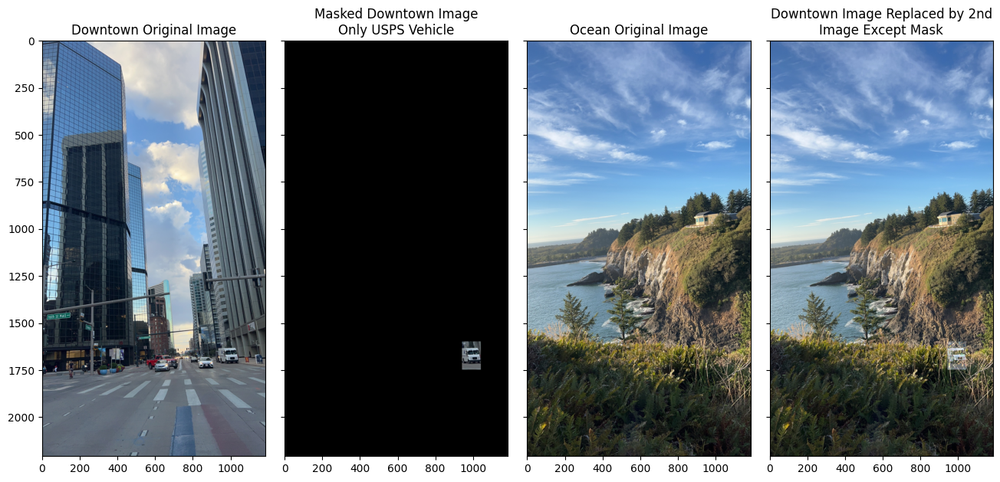

In [8]:
# Get first image (downtown) dimensions
rows, cols, channels = downtown_img.shape

# create a binary mask so we can use bitwise method.
mask = np.zeros_like(downtown_img,dtype=np.uint8)

# mask the region of interest (the usps vehicle)
mask[rows-608:rows-458, cols-246:cols-146, :] = 255

# only show the usps vehicle with the surrounding in black
masked_img = cv.bitwise_and(downtown_img,mask)

# replace everything in the surrounding with the second image (ocean)
result = cv.bitwise_or(masked_img, ocean_img)

disp_images(shape=(1,4),
            images=[downtown_img,masked_img, ocean_img,result],
            title=['Downtown Original Image',
                   'Masked Downtown Image\nOnly USPS Vehicle',
                   'Ocean Original Image',
                   'Downtown Image Replaced by 2nd\nImage Except Mask'],
            params=False)

# Histogram Equalization

**Perform a histogram equalization on your image. Show the original and equalized image side-by-side.**
---

- Simply put, image histogram is a way of showing how much intensity values within an image occur (class notes, [cv docs](https://docs.opencv.org/3.4/d4/d1b/tutorial_histogram_equalization.html), and [online resources](https://youtu.be/flI_Umo_VAU?si=XriROXGS24wypWfN)).

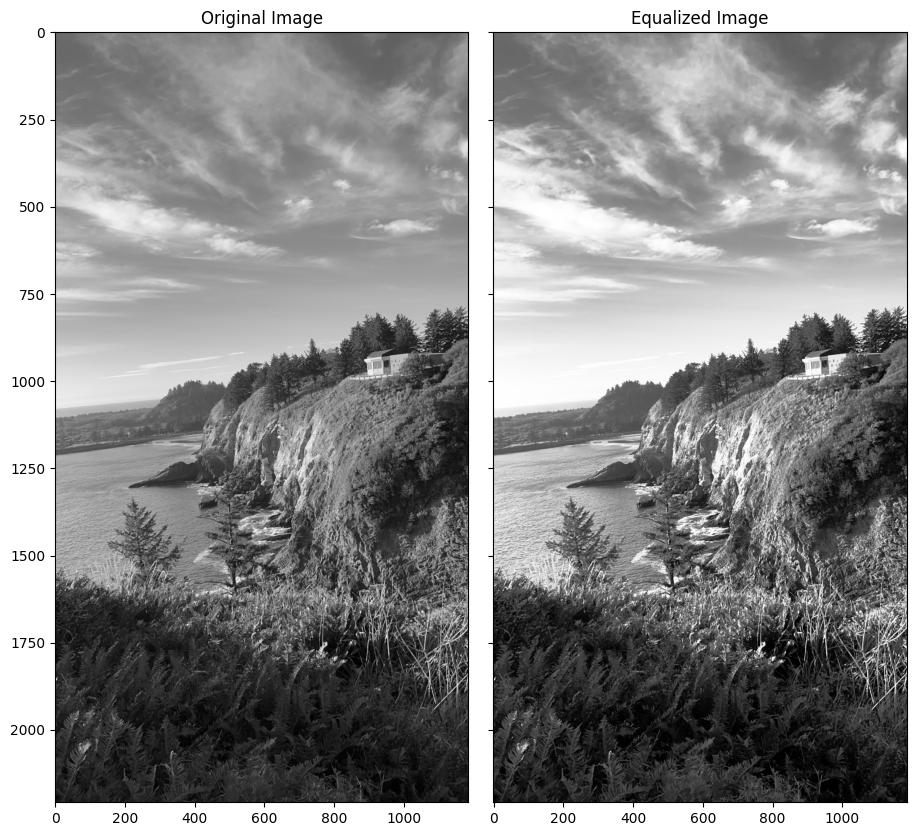

In [9]:
ocean_img_gray = cv.cvtColor(ocean_img.copy(), cv.COLOR_RGB2GRAY)
ocean_eq = cv.equalizeHist(ocean_img_gray)
disp_images(shape=(1,2),
            images=[ocean_img_gray, ocean_eq],
            title=['Original Image',
                   'Equalized Image'],
            params=True)

**Plot a histogram of intensities before and after the equalization**
---

(2208, 1186)
(2618688,)


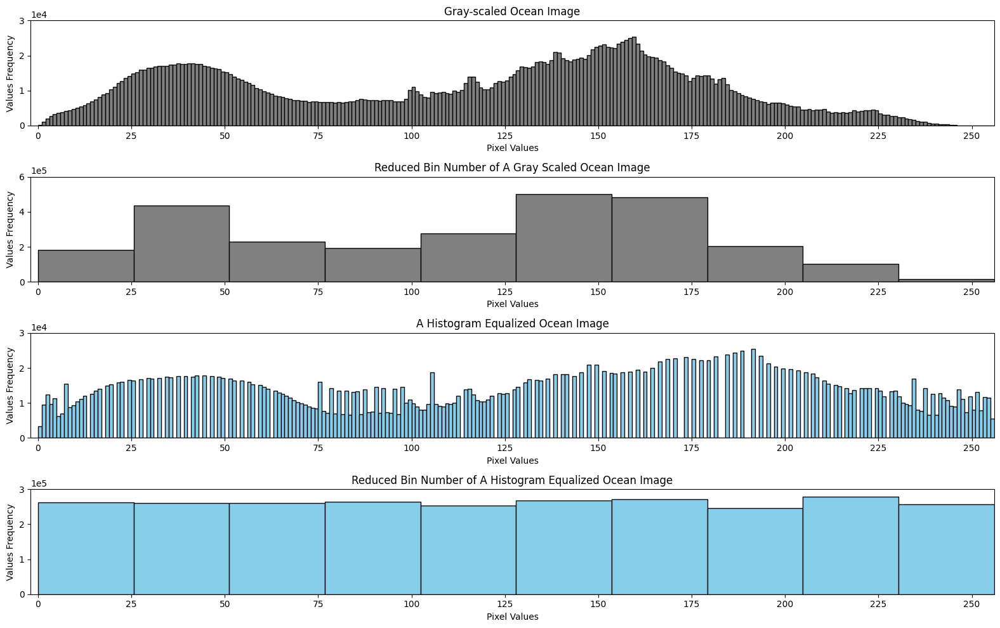

[105 105 104 ...  17  27  28]

-----

[104 104 103 ...   8  21  22]


In [10]:
fig, ax = plt.subplots(nrows=4, ncols=1,figsize=(16,10))
print(ocean_img_gray.shape)
print((ocean_img_gray.ravel()).shape)

ax[0].hist(x=ocean_img_gray.ravel(),range=[0,256],bins=256, edgecolor='k', facecolor='gray')
ax[0].set_xlim([-2,256])
ax[0].set_ylim([0,30000])
ax[0].set_xlabel('Pixel Values')
ax[0].set_ylabel('Values Frequency')
ax[0].set_title('Gray-scaled Ocean Image')
ax[0].xaxis.set_major_locator(ticker.MaxNLocator(11))
ax[0].ticklabel_format(style='sci', axis='y', scilimits=(0,0))

ax[1].hist(x=ocean_img_gray.ravel(),range=[0,256],bins=10, edgecolor='k', facecolor='gray')
ax[1].set_xlim([-2,256])
ax[1].set_ylim([0,600000])
ax[1].set_xlabel('Pixel Values')
ax[1].set_ylabel('Values Frequency')
ax[1].set_title('Reduced Bin Number of A Gray Scaled Ocean Image')
ax[1].xaxis.set_major_locator(ticker.MaxNLocator(11))
ax[1].ticklabel_format(style='sci', axis='y', scilimits=(0,0))

ax[2].hist(x=ocean_eq.ravel(),range=[0,256],bins=256, edgecolor='k', facecolor='skyblue')
ax[2].set_xlim([-2,256])
ax[2].set_ylim([0,30000])
ax[2].set_xlabel('Pixel Values')
ax[2].set_ylabel('Values Frequency')
ax[2].set_title('A Histogram Equalized Ocean Image')
ax[2].xaxis.set_major_locator(ticker.MaxNLocator(11))
ax[2].ticklabel_format(style='sci', axis='y', scilimits=(0,0))

ax[3].hist(x=ocean_eq.ravel(),range=[0,256],bins=10, edgecolor='k', facecolor='skyblue')
ax[3].set_xlim([-2,256])
ax[3].set_ylim([0,300000])
ax[3].set_xlabel('Pixel Values')
ax[3].set_ylabel('Values Frequency')
ax[3].set_title('Reduced Bin Number of A Histogram Equalized Ocean Image')
ax[3].xaxis.set_major_locator(ticker.MaxNLocator(11))
ax[3].ticklabel_format(style='sci', axis='y', scilimits=(0,0))

fig.tight_layout()
plt.show()

print(ocean_img_gray.ravel())
print('\n-----\n')
print(ocean_eq.ravel())

**State a justification for how you handled the three color channels**
---

The goal of the histogram equalization is improve the contrast of a given image. The histogram equalization achieves this goal by distributing the intensities of the pixels within the image. The three color channels were not used to address this question. All the images were converted to a gray-scale, wherein the color channels became one channel. I flattened the matrices of each image (pixel values) into 1D array using ```np.ravel()``` (as shown in class) and plot the histograms.

**State a justification for the parameter values that you chose such as the bin size and how you normalized the histogram**
---

The histogram is normalized using the numpy ```.ravel()``` method. All three plots show the pixel intensity distribution of the original image and the equalized image.

#### Gray-scaled Ocean Image (Top plot $\&$ Third Plot):

- **First plot:**

    - The bin size in this plot is 256; in this case, the bin size represents the values of the pixels.
    - For instance, pixels intensities of zero occured $\approx$ zero times (y-axis). 
    - Similarly, the pixels intensities increase; their associated occurances on the y-axis increase as well.
    - There is a significant difference between the distribution of pixel intensities. Within the ocean image, the pixel intensities are highest between the range of (x-axis = 125-175). Another peak of intensities also occured within the intensity range of (x-axis = 20 - 60).

- **Third Plot:**

    - After using the ```equalizedHist()``` method, the distribution of the pixel values across the 256 range has become more imperative.
    - Note that the zero pixel value and its number of occurances are no longer zero. Further, the pixel values $\geq$ 230 are also no longer zero.
    - It is also important to note the gaps between the bars in this plot. These gaps are because the distribution is more uniform. As such, some pixel intensities are higher than others.

#### Reduced Bin Size (Second Plot $\&$ Fourth plot):

- As the bins are reduced, the amount of pixel values that we can fit in the bins increases. As such, the impact of the ```.equalizedHist()``` method can be clearly visulaized.
- For instance, in the second plot, the height of each bin is significantly different than the rest of the bins. Therefore, the pixel intensity values are not distributed over the image, which means that the contrast of the image can be improved further.


# Smooth the image

**Choose a smoothing kernel**
---

In [11]:
def gaussian_kernel (image_smooth):
    rows = 19
    cols = 19
    smoothed_img = cv.GaussianBlur(image_smooth, (rows,cols),0)
    return smoothed_img


**Show the smoothed image side by side with the original image**
---

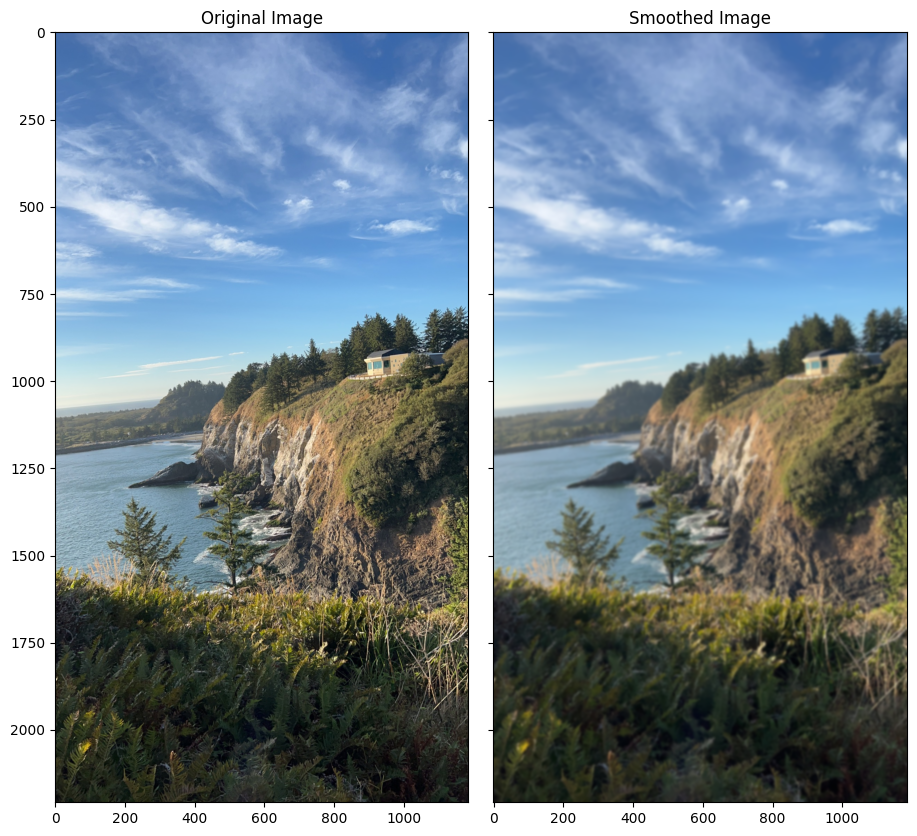

In [12]:
smoothed_img = gaussian_kernel(ocean_img)
disp_images(shape=(1,2),
            images=[ocean_img,smoothed_img],
            title=['Original Image', 'Smoothed Image'],
            params=True)

# Border Effects

**Crop an image down to a small size of roughly 50 pixels per side**
---

In [13]:
cut_size = 50
ocean_img_2 = ocean_img_gray.copy()
cropped_ocean = ocean_img_2[cut_size:-cut_size, cut_size:-cut_size]
print('Original Image dimensions:\t',ocean_img_gray.shape)
print('Cropped Image dimensions:\t',cropped_ocean.shape)

Original Image dimensions:	 (2208, 1186)
Cropped Image dimensions:	 (2108, 1086)


**Show the effect of smoothing the image with three different types of border padding**
---

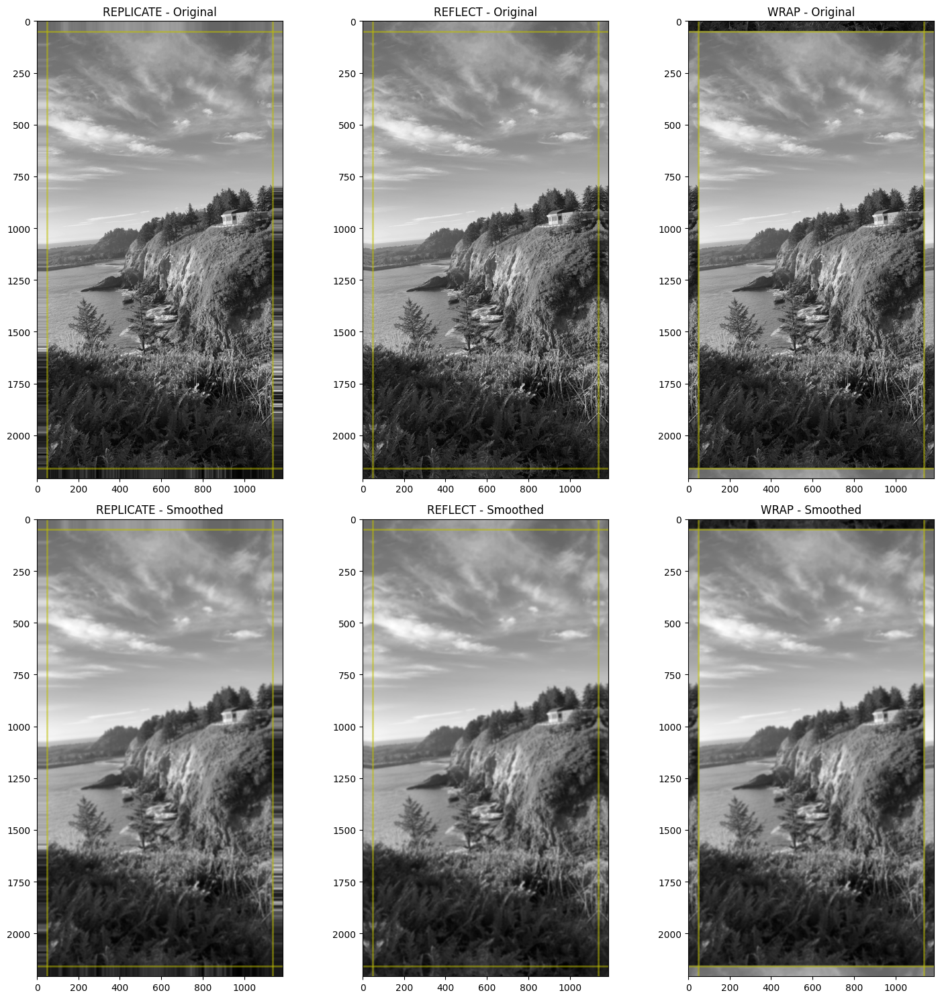

In [14]:
borders_dict = {'REPLICATE':cv.BORDER_REPLICATE,
                'REFLECT':cv.BORDER_REFLECT,
                'WRAP':cv.BORDER_WRAP
                }

def draw_borders(ax, img, cut_size, key, j, k):
    ax[j, k].axvline(cut_size, color='y', linewidth=2, alpha=0.5)
    ax[j, k].axvline(img.shape[1] - cut_size, color='y', linewidth=2, alpha=0.5)
    ax[j, k].axhline(img.shape[0] - cut_size, color='y', linewidth=2, alpha=0.5)
    ax[j, k].axhline(cut_size, color='y', linewidth=2, alpha=0.5)
    ax[j, k].set_title(f'{key} - Original')

    ax[j+1, k].axvline(cut_size, color='y', linewidth=2, alpha=0.5)
    ax[j+1, k].axvline(smoothed_img.shape[1] - cut_size, color='y', linewidth=2, alpha=0.5)
    ax[j+1, k].axhline(smoothed_img.shape[0] - cut_size, color='y', linewidth=2, alpha=0.5)
    ax[j+1, k].axhline(cut_size, color='y', linewidth=2, alpha=0.5)
    ax[j+1, k].set_title(f'{key} - Smoothed')




fig, ax = plt.subplots(2,3,figsize=(15, 15))

for i, (key, value) in enumerate(borders_dict.items()):
    img = cv.copyMakeBorder(cropped_ocean, cut_size, cut_size, cut_size, cut_size, borderType=value)
    smoothed_img = gaussian_kernel(img)
    

    j = i // 3
    k = i % 3
    
    ax[j, k].imshow(img, cmap='gray')
    ax[j+1, k].imshow(smoothed_img, cmap='gray')
    
    draw_borders(ax, img, cut_size, key, j, k)

plt.tight_layout()
plt.show()


**For each image describe the effects of each choice of border padding**
---

- **REPLICATE (First column in the above figure):**
    - This padding replicates the pixels in the edges of the image. For instance, if the last pixel value were to be a constant, this value will be replicated beyond the edges of the image. The smoothing or blurring process, if done after the border padding, will include the the new image area wherein the replicated pixels are located.

- **REFLECT (Second column in the above figure):**
    - In this type, the edge pixels are mirrored. This can be seen in the middle images in the above figure. Note the trees on the righ of the image are mirrored after the yellow line. Similarly, the ocean and trees on the left side of the image are also mirrored. 
    - **NOTE**
        - It looks like the clouds in this image are reflected downwards, but the ocean is relected upward. I don't know why that is. I'll investigate this further.

- **WRAP (Last column in the above Figure):**
    - This type wraps the lower x-axis with the top one, and the right y-axis with the left one. Beyond the yellow lines in the figure, it can be seen that the pixels from the opposite sides have been padded.

# Directional Derivative

**Pick some method of generating derivatives for one of your images. Explain why you chose this particular method and what advantages and disadvantages it might have over other methods**
---

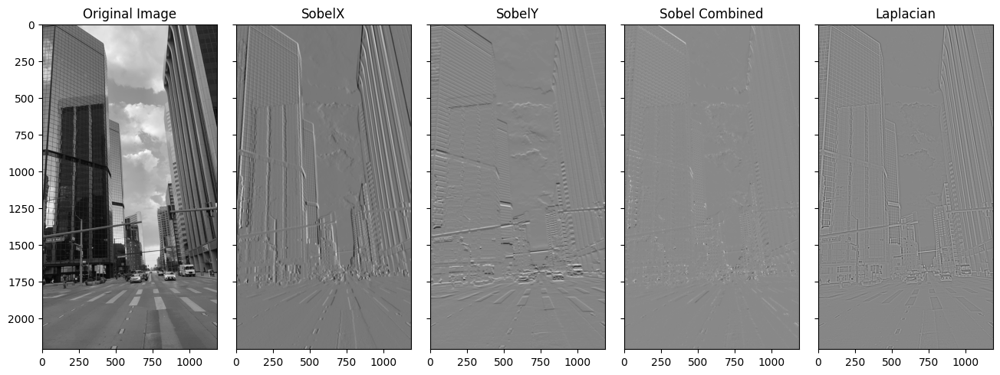

In [15]:
def filters (img, kernal_size):
    
    derivative_x = cv.Sobel(src=img, ddepth=cv.CV_64F, dx=1,dy=0, ksize=kernal_size)
    derivative_y = cv.Sobel(src=img, ddepth=cv.CV_64F, dx=0,dy=1, ksize=kernal_size)
    sobel_combined = cv.bitwise_and(derivative_x, derivative_y)
    laplacian = cv.Laplacian(src=img, ddepth=cv.CV_64F, ksize=kernal_size)
    # scharr_x = cv.Scharr(src=img, ddepth=cv.CV_64F, dx=1, dy=0)
    # scharr_y = cv.Scharr(src=img, ddepth=cv.CV_64F, dx=0, dy=1)
    
    return derivative_x, derivative_y, sobel_combined, laplacian #,scharr_x, scharr_y

downtown_gray = cv.cvtColor(downtown_img, cv.COLOR_RGB2GRAY)
derivative_x, derivative_y, sobel_combined, laplacian = filters(img=downtown_gray, kernal_size=31)
disp_images(shape=(1,5), images=[downtown_gray, derivative_x, derivative_y, sobel_combined, laplacian],
            title=['Original Image','SobelX','SobelY','Sobel Combined','Laplacian'],params='None')

The chosen method to proceed with for the rest of this part is the laplacian. The sobel methods work okay for the chosen image. However, they do not detect the small details in the image. 

- SobelX:

    - From the figure above, the sobel derivative with respect to $x$ is more sensitive to changes on the vertical axis. The building edges are clearly specified.
    - The road lines are clear; the changes on the road on the coordinates (x $\approx (720 - 100)$ and y $\approx (1800 - 2250)$) are shown clearly.
    - The cars within the image almost appear as a noise. Without looking at the original image, I think it'd be hard to recognize these cars in SobelX image.

- SobelY:

    - The SobelY is sensistive to changes on the horizontal axis. Note that the cars are obvious now.
    - The gaps between the white and dark colors in the road lines are shown clearly.
    - The building edges and the traffic lights are obvious.

- Combined Sobel:

    - I thought combining both, the sobelX and sobelY would give a better output. But, the output appears to be a pure mathematical operation between the x and y sobel derivatives. I need to work on understanding these filters better.

- Laplacian:

    - I think this method is doing a terrific job of detecting the edges of each object within the image, excluding the clouds. The cars, building edges, some of the clouds, road lines, and the reflection of right building on the left building are clearly shown.

**General Notes:**

- The large kernal size may have affected the detection of small details. However, I did try different kernal sizes, starting from 3 to 31. The sobel X did well on the a kernel size of 5. However, the cars were still invisible. Please see the next figure for visualization on kernel size of 5. Further, higher order gradients increase the detection on the respective axes, not the overall image.

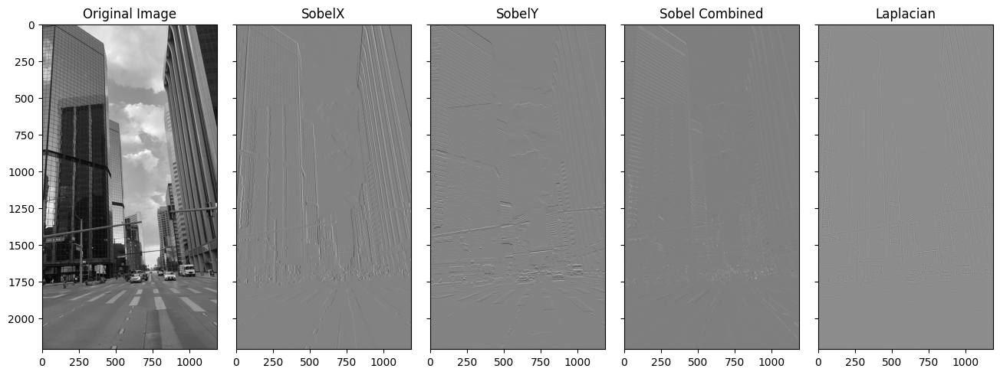

In [16]:
derivative_x_k, derivative_y_k, sobel_combined_k, laplacian_k = filters(img=downtown_gray, kernal_size=5)
disp_images(shape=(1,5), images=[downtown_gray, derivative_x_k, derivative_y_k, sobel_combined_k, laplacian_k],
            title=['Original Image','SobelX','SobelY','Sobel Combined','Laplacian'],params='None')

**For a grayscale image that you generated, calculate the directional derivative over a range of angles from 0 degrees to 360 degrees.**
---

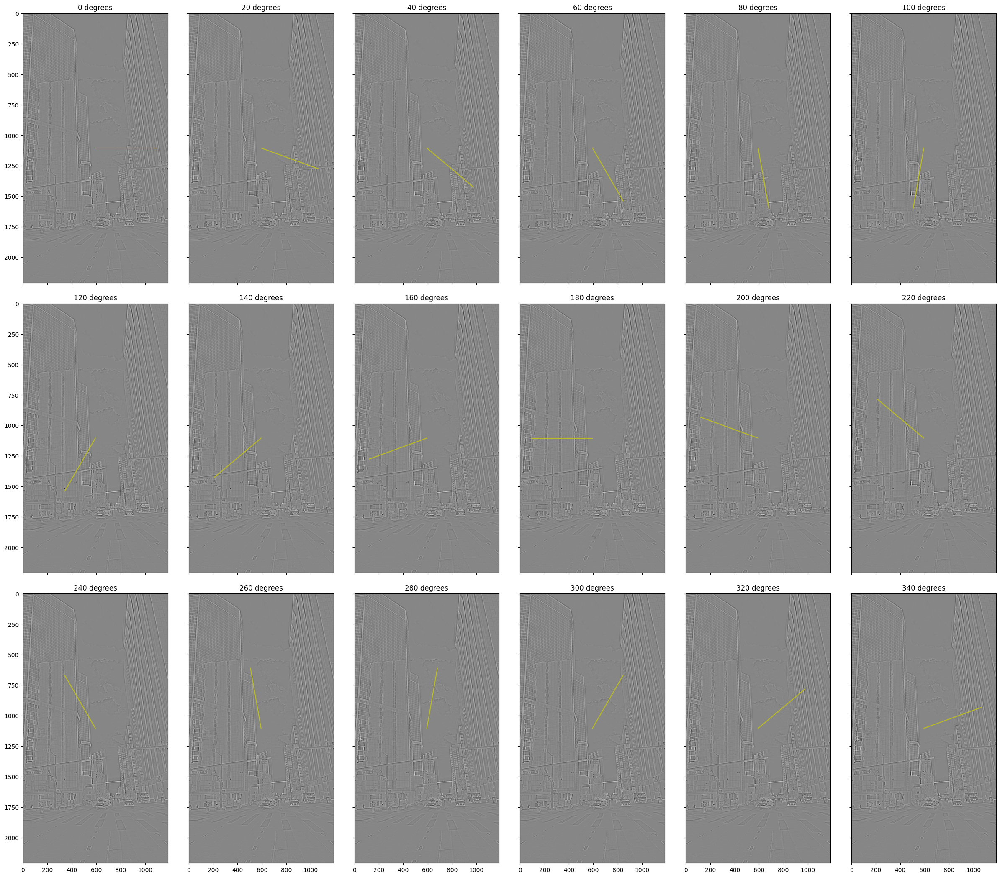

In [25]:
import math
angles = range(0,360,20)

fig = plt.figure(figsize=(30,30))
grid = ImageGrid(fig,
                 111,
                 nrows_ncols=(3,6),
                 axes_pad=0.5)

for ax, angle in zip(grid, angles):
    
    theta = math.radians(angle)
    directional_derivative = (laplacian * np.cos(theta)) + (laplacian * np.sin(theta))
    ax.imshow(laplacian, cmap='gray')
    
    line_x = 500 * np.cos(math.radians(angle))
    line_y = 500 * np.sin(math.radians(angle))
    
    ax.plot([laplacian.shape[1] // 2, laplacian.shape[1] // 2 + line_x],
            [laplacian.shape[0] // 2, laplacian.shape[0] // 2 + line_y],
            color='tab:olive')
    # Finding the center of the pixels is determined by dividing the width and height by a factor of 2.
    
    ax.set_title(f'{angle} degrees')

plt.show()
    
    
    

**Provide justification for your design and the parameter values that you chose**
---

- Derivative choice:
  
    - The laplacian obviously did a good job of detecting the edges of each object in the image, including the small things like the traffic lights, line on the road, and even far away buildings.
    - The other derivative operators did not do well on detecting the edges of the building or even the cars. These cars appeared blurry, like a pile of pixels on top of each other.

- Parameters:

    - **Kernal size:** The chosen kernal size was large. It was based on trial-and-error. The reason for choosing such kernal is the details of the objects within the image would not appear correctly. Maybe the image itself has too much features and small details that 
    I had my eyes on. For example, the reflection of the right building to the left was not obvious with small-size kernals.

    - **Angle Line length:** The scaling factor for the angle line length was set to 500 to clearly show the line on the image. I don't think this would adversly imact the derivative operator used in this work.

# Laplacian of Gaussian (LoG) and Difference of Gaussian (DoG) Filters

**Pick a width of the Gaussian to use and apply the LoG to your image. Show the original and Laplacian side by side.**
---

**Repeat the previous question, but with a Difference of Gaussians that produces close to the same effect.**
---

**Repeat a third time, but with the Gaussian gradient magnitude.**
---

**If you were to develop an algorithm for detecting edges in an image based on applying a threshold to the output of one of these approaches, which of these three approaches do you think would work best? Why?**
---